In [4]:
import random
import cv2
import numpy as np
import albumentations as A
import yaml
import json
import os  
from tqdm import tqdm
from ultralytics import YOLO
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from IPython.display import Image as IPImage, display

In [5]:

import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from ultralytics import YOLO


def predict(image_path, model_path='runs/detect/celebrity_detection7/weights/best.pt', save_as='prediction_result.jpg'):
    """Predict celebrities in image"""
    
    model = YOLO(model_path)
    results = model(image_path, imgsz=640, conf=0.15, iou=0.4)
    
    for result in results:
        img = cv2.imread(image_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        fig, ax = plt.subplots(1, figsize=(20, 20))
        ax.imshow(img_rgb)
        
        print("=" * 80)
        print(f" DETECTED {len(result.boxes)} CELEBRITIES")
        print("=" * 80)
        
        for i, box in enumerate(result.boxes):
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
            conf = float(box.conf[0])
            cls = int(box.cls[0])
            celebrity_id = model.names[cls]
            
            print(f"\n{i+1}. Celebrity ID: {celebrity_id}")
            print(f"   Location: ({x1:.0f}, {y1:.0f}) → ({x2:.0f}, {y2:.0f})")
            print(f"   Confidence: {conf*100:.1f}%")
            
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, 
                                     linewidth=3, edgecolor='lime', facecolor='none')
            ax.add_patch(rect)
            
            label = f'{celebrity_id}\n{conf:.2f}\n({int(x1)},{int(y1)})'
            ax.text(x1, y1-15, label, color='lime', fontsize=10, weight='bold',
                   bbox=dict(boxstyle='round', facecolor='black', alpha=0.8))
        
        print("=" * 80)
        
        ax.axis('off')
        plt.title(f'Detected {len(result.boxes)} Celebrities', fontsize=16, weight='bold')
        plt.tight_layout()
        plt.savefig(save_as, dpi=150, bbox_inches='tight')
        print(f"\n Saved: {save_as}")
        plt.show()

print("Ready!")



Ready!



image 1/1 /courses/IE7615.202610/students/swamy.ar/OD-V2/concat_0023.jpg: 640x640 1 images__1499_, 1 images__1964_, 2 images__2463_s, 1 images__2820_, 1 images__2880_, 1 images__3227_, 1 images__3321_, 1 images__3401_, 1 images__447_, 3 images__619_s, 3 images__6568_s, 1 images__7282_, 1 images__8265_, 1 images__8871_, 1 images__8945_, 1 images__8968_, 1 images__9063_, 1 images__9152_, 1 images__9256_, 1 images__9319_, 9.5ms
Speed: 2.3ms preprocess, 9.5ms inference, 13.9ms postprocess per image at shape (1, 3, 640, 640)
 DETECTED 25 CELEBRITIES

1. Celebrity ID: images__6568_
   Location: (768, 511) → (1024, 767)
   Confidence: 99.7%

2. Celebrity ID: images__619_
   Location: (256, 767) → (512, 1023)
   Confidence: 99.4%

3. Celebrity ID: images__2880_
   Location: (0, 768) → (256, 1023)
   Confidence: 99.3%

4. Celebrity ID: images__9152_
   Location: (0, 255) → (256, 511)
   Confidence: 99.1%

5. Celebrity ID: images__8265_
   Location: (255, 0) → (511, 256)
   Confidence: 99.1%

6

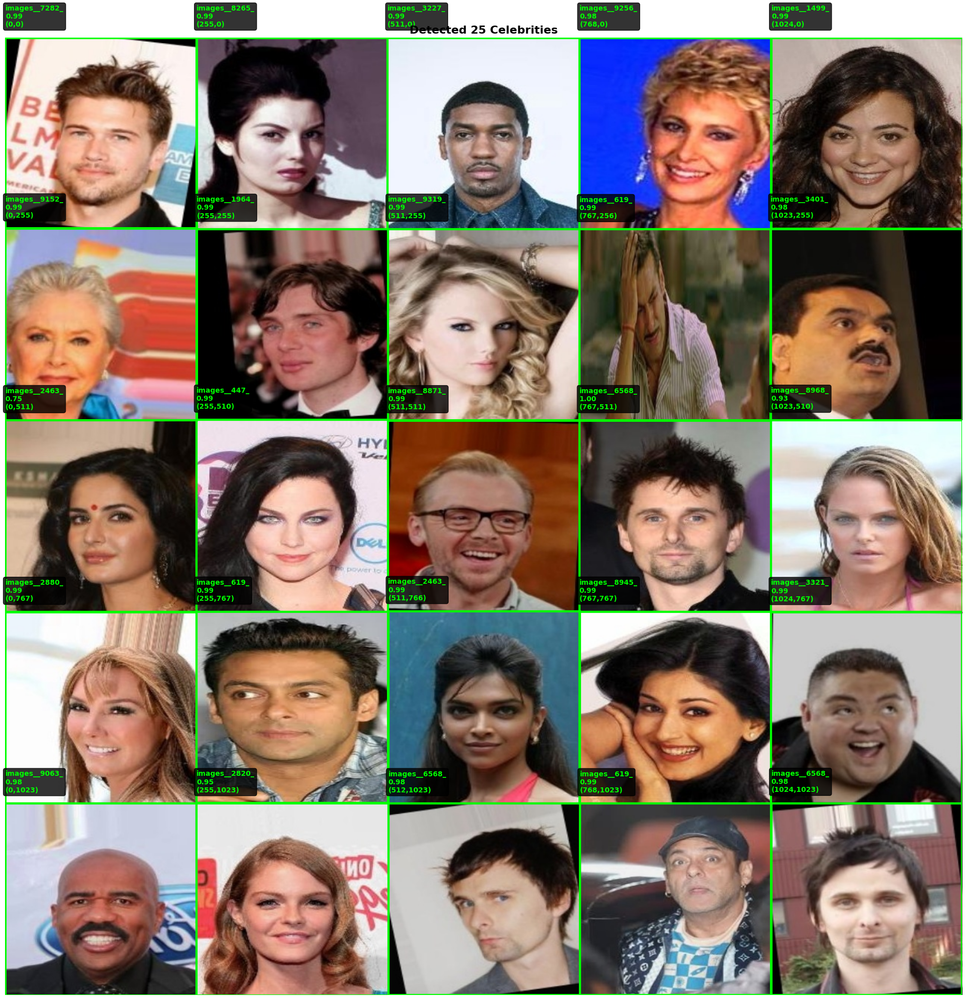

In [6]:
predict('concat_0023.jpg',save_as='my_test_detection_new_att.jpg')


image 1/1 /courses/IE7615.202610/students/swamy.ar/OD-V2/concat_0041.jpg: 640x640 1 images__10173_, 1 images__1499_, 1 images__228_, 3 images__2820_s, 2 images__2880_s, 1 images__3321_, 1 images__3698_, 1 images__3745_, 1 images__4126_, 1 images__447_, 1 images__5239_, 1 images__6098_, 2 images__6568_s, 2 images__8265_s, 1 images__8722_, 1 images__8945_, 2 images__8968_s, 1 images__9151_, 1 images__9319_, 9.5ms
Speed: 2.3ms preprocess, 9.5ms inference, 13.8ms postprocess per image at shape (1, 3, 640, 640)
🎯 DETECTED 25 CELEBRITIES

1. Celebrity ID: images__447_
   Location: (511, 511) → (767, 767)
   Confidence: 99.5%

2. Celebrity ID: images__8265_
   Location: (512, 0) → (767, 257)
   Confidence: 99.5%

3. Celebrity ID: images__2820_
   Location: (1024, 511) → (1280, 768)
   Confidence: 99.3%

4. Celebrity ID: images__228_
   Location: (512, 1023) → (768, 1280)
   Confidence: 99.2%

5. Celebrity ID: images__6568_
   Location: (256, 1023) → (512, 1280)
   Confidence: 99.1%

6. Celeb

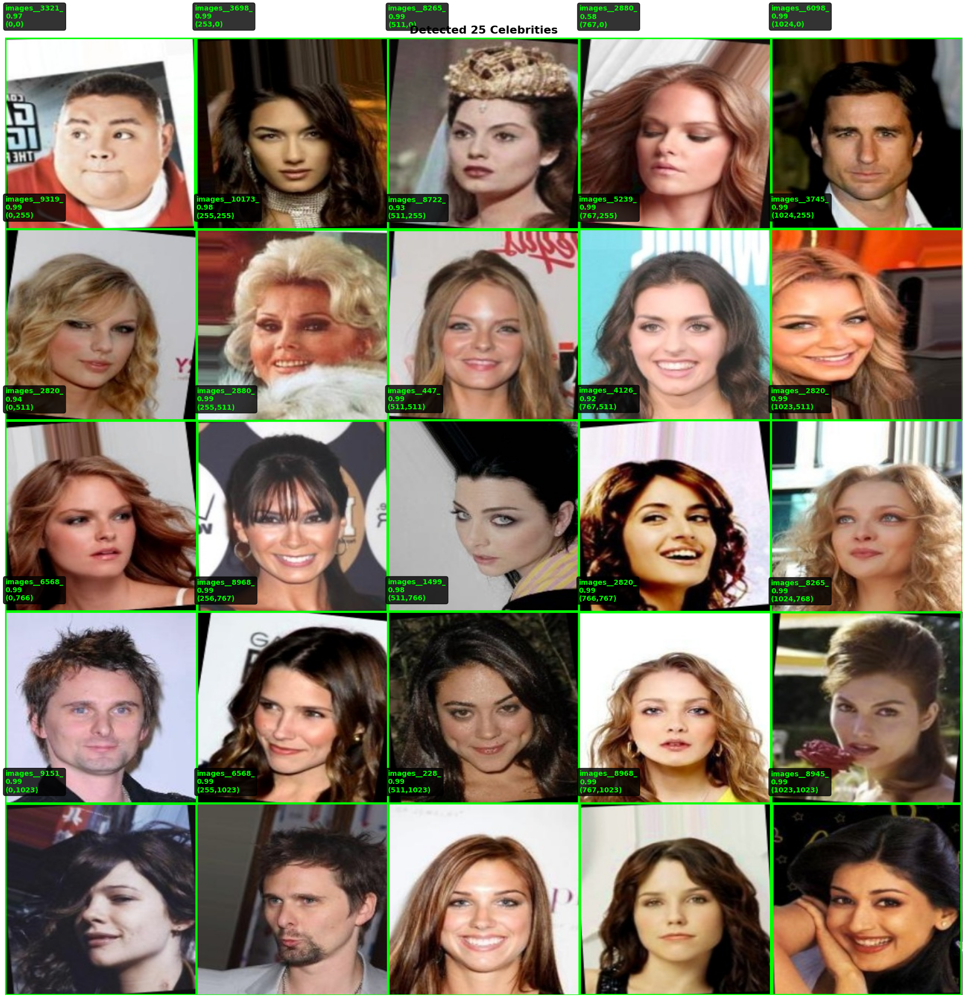

In [12]:
predict('concat_0041.jpg', save_as='my_test_detection5.jpg')